In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras
import keras
from keras import layers
from keras import Model
import numpy as np
import os
import tqdm
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import random
import seaborn as sns

c:\Users\ntsec\anaconda3\envs\new_env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
resnet_loaded =  keras.models.load_model('rus_art\cp_3-221.keras')

c:\Users\ntsec\anaconda3\envs\new_env\lib\site-packages\keras\src\saving\saving_lib.py:394: UserWarning: Skipping variable loading for optimizer 'adam', because it has 690 variables whereas the saved optimizer has 2 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


In [5]:
class_ids = pd.read_csv('label_to_id.csv',sep = '\t')
class_ids['globalclass'] = class_ids['label_name'].apply(lambda x: x.split('/')[0])
class_ids['miniclass'] = class_ids['label_name'].apply(lambda x: x.split('/')[1])
class_ids

,label_name,label_id,globalclass,miniclass
0,Скульптура/Исторический,0,Скульптура,Исторический
1,ДПИ/Изделия из керамики,1,ДПИ,Изделия из керамики
2,Живопись/Исторический,2,Живопись,Исторический
3,Скульптура/Портрет,3,Скульптура,Портрет
4,Живопись/Батальный,4,Живопись,Батальный
5,Графика/Натюрморт,5,Графика,Натюрморт
6,ДПИ/Роспись,6,ДПИ,Роспись
7,Архитектура/Барокко,7,Архитектура,Барокко
8,Графика/Прикладная графика,8,Графика,Прикладная графика
9,Архитектура/Классицизм,9,Архитектура,Классицизм


In [6]:
class_mapping = dict(zip(class_ids['label_id'], class_ids['label_name']))
class_mapping_mini = dict(zip(class_ids['label_id'], class_ids['miniclass']))
class_mapping

{0: 'Скульптура/Исторический',
 1: 'ДПИ/Изделия из керамики',
 2: 'Живопись/Исторический',
 3: 'Скульптура/Портрет',
 4: 'Живопись/Батальный',
 5: 'Графика/Натюрморт',
 6: 'ДПИ/Роспись',
 7: 'Архитектура/Барокко',
 8: 'Графика/Прикладная графика',
 9: 'Архитектура/Классицизм',
 10: 'Живопись/Натюрморт',
 11: 'Живопись/Другое',
 12: 'ДПИ/Другое',
 13: 'Архитектура/Советская архитектура',
 14: 'Живопись/Мифологический (сказочный)',
 15: 'Графика/Пейзаж',
 16: 'ДПИ/Ткачество ',
 17: 'Архитектура/Авангард и модерн',
 18: 'Архитектура/Древнерусская архитектура',
 19: 'Графика/Другое',
 20: 'Скульптура/Анималистический',
 21: 'Живопись/Анималистический',
 22: 'Живопись/Бытовой',
 23: 'Живопись/Авангард',
 24: 'Графика/Плакат',
 25: 'ДПИ/Изделия из дерева',
 26: 'Архитектура/Другое (арх-ра)',
 27: 'Живопись/Пейзаж',
 28: 'Архитектура/Историзм',
 29: 'Скульптура/Другое',
 30: 'ДПИ/Мозаика ',
 31: 'Живопись/Портрет',
 32: 'Графика/Портрет',
 33: 'Живопись/Религиозная живопись',
 34: 'Графика/Кн

In [7]:
df = pd.read_csv('train_lables.csv',sep= '\t')
df = df.sample(len(df), random_state= 42).reset_index(drop=True)
df

,image_name,label_id
0,8d705100db3148659fdbb1c6899e48c6.jpg,6
1,34a7de32000b424e801f08880c383dd4.webp,9
2,336026e3f2904e54b1cb06877f39a5a5.jpg,16
3,ab71336e97584b09b2da208a2c3e9b24.jpg,21
4,5298888bf29f476d951fac6fde8a941c.jpg,16
...,...,...
8610,7a51af7b391143418002fd288e6113b1.jpg,23
8611,66f57d8047844136b564b5de339aae09.jpg,21
8612,f455dcc345a245f4991dca7146a2b144.jpg,22
8613,4fd4eb5c7e1844ab8bbf28ef03fabafc.jpg,4


In [8]:
cur_path = os.getcwd()
print(cur_path)
imges_path = os.path.join(cur_path,'train')
print(imges_path)

c:\Users\ntsec\Desktop\jup_projects_1\rus_art0
c:\Users\ntsec\Desktop\jup_projects_1\rus_art0\train


In [72]:
p = os.path.join("./train/",'0a0ad6cc9f5c4a2493633d85f9347b0a.jpeg')

In [73]:
img = Image.open(p).convert('RGB')

In [79]:
b = np.array(os.listdir("./train/"))[0]

'000368b8fdc747d98d0511879fb74412.jpg'

In [86]:
import time
from IPython.display import clear_output

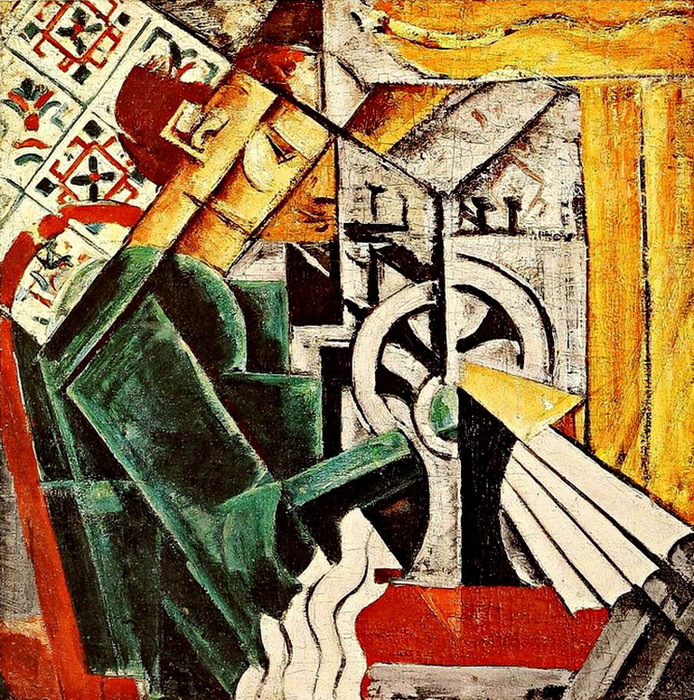

KeyboardInterrupt: 

In [87]:
all_paths  = np.array(os.listdir("./train/"))
for i in range(len(all_paths)):
    p = os.path.join("./train/",all_paths[i])
    img = Image.open(p).convert('RGB')
    clear_output()
    display(img)
    time.sleep(3)

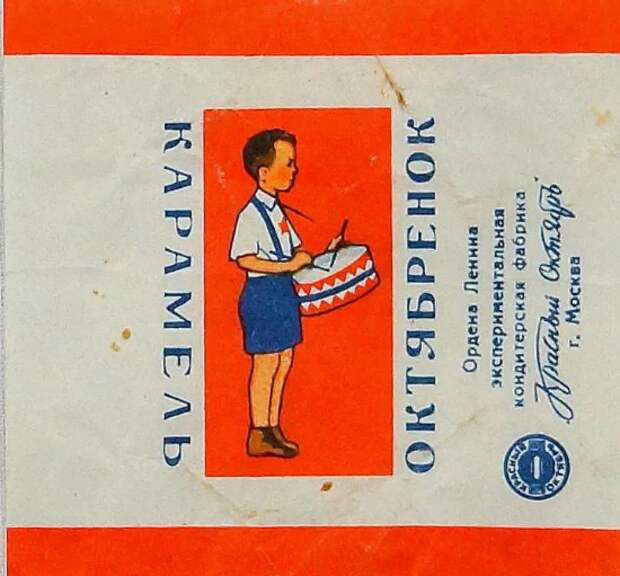

In [74]:
img

In [9]:
train_table = df[0:int(len(df)*0.8)]
test_table = df[int(len(df)*0.8):]

In [10]:
IMG_SIZE = 224
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMG_SIZE, IMG_SIZE),
    layers.Rescaling(1./127.5, offset = -1)
    ])

In [11]:
full_size = (224,224,3)

In [12]:
def read_image(img_file):
    img_file = str(img_file.numpy(),encoding='utf-8')
    img = Image.open(os.path.join(imges_path,img_file)).convert('RGB')
    img = np.array(img)
    img = tf.constant(img,dtype=tf.float32)
    img = resize_and_rescale(img, training=True)
    return img

In [13]:
def load(x):
    img = tf.py_function(read_image, [x], [tf.float32])
    img = img[0]
    img = tf.ensure_shape(img,full_size)
    return(img)

In [14]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal"),
  layers.RandomRotation(0.1),
  layers.RandomContrast(0.2),
  layers.RandomBrightness(0.3, value_range=(0, 1)),
])

In [15]:
batch_size = 32
AUTOTUNE = tf.data.AUTOTUNE
def create_tf_dataset(df, Train = True):
    file_paths = df['image_name'].values
    labels = df['label_id'].values
    labels = keras.utils.to_categorical(labels)
    data_set = tf.data.Dataset.from_tensor_slices((file_paths, labels))
    data_set = data_set.map(lambda x, y: (load(x), y), num_parallel_calls=AUTOTUNE)
    print('images readed')
    data_set = data_set.shuffle(6900)
    data_set = data_set.batch(batch_size)
    
    if Train:
        data_set = data_set.map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=AUTOTUNE)
    data_set = data_set.prefetch(buffer_size=AUTOTUNE)
    return data_set

In [16]:
def create_tf_dataset_(df, train = True):
    file_paths = df['image_name'].values
    labels = df['label_id'].values
    labels = keras.utils.to_categorical(labels)
    data_set = tf.data.Dataset.from_tensor_slices((file_paths, labels))
    data_set = data_set.map(lambda x, y: (load(x), y), num_parallel_calls=AUTOTUNE)
    print('images readed')
    if train:
        data_set = data_set.shuffle(6900)
        data_set = data_set.batch(batch_size)
        data_set = data_set.map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=AUTOTUNE)
    else:
        data_set = data_set.batch(1)
    data_set = data_set.prefetch(buffer_size=AUTOTUNE)
    return data_set

In [17]:
def create_test_dataset(df):
    file_paths = df['image_name'].values
    labels = df['label_id'].values
    labels = keras.utils.to_categorical(labels)
    data_set = tf.data.Dataset.from_tensor_slices(file_paths)
    data_set = data_set.map(lambda x: load(x), num_parallel_calls=AUTOTUNE)
    data_set = data_set.batch(1)
    data_set = data_set.prefetch(buffer_size=AUTOTUNE)
    return data_set

In [14]:
train_ds = create_tf_dataset(train_table)

images readed


In [15]:
train_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 35), dtype=tf.float64, name=None))>

In [18]:
val_ds = create_tf_dataset(test_table, Train = False)

images readed


In [19]:
resnet_loaded.evaluate(val_ds)

54/54 ━━━━━━━━━━━━━━━━━━━━ 248s 4s/step - accuracy: 0.8428 - loss: 0.7274


[0.6944407820701599, 0.8508415818214417]

In [17]:
val_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 35), dtype=tf.float64, name=None))>

In [18]:
def visualize_ds(ds: tf.data.Dataset,rows: int,coloumns: int, class_mapping: dict = None):
    '''
    visualize elements of ds with lables
    '''
    fig = plt.figure(figsize=(10,10),facecolor = (0.4, 0.5, 0.4))
    i = 0
    for item in ds.unbatch().take(rows*coloumns):
        image = item[0].numpy()
        label = np.argmax(item[1].numpy())
        if class_mapping != None:
            label = class_mapping[label]
        # print(label)
        fig.add_subplot(rows,coloumns,i+1)
        plt.imshow(image)
        plt.axis('off')
        x_text = image.shape[1]/2
        y_text = image.shape[0]*0.9
        plt.text(x_text, y_text,label, size=7,
                ha="center", va="center",
                bbox=dict(boxstyle="round",
                   ec=(0, 0, 0),
                   fc=(1, 1, 1, 0.8),
                   )
                )
        i+=1
    plt.show()

c:\Users\ntsec\anaconda3\envs\new_env\lib\site-packages\PIL\Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


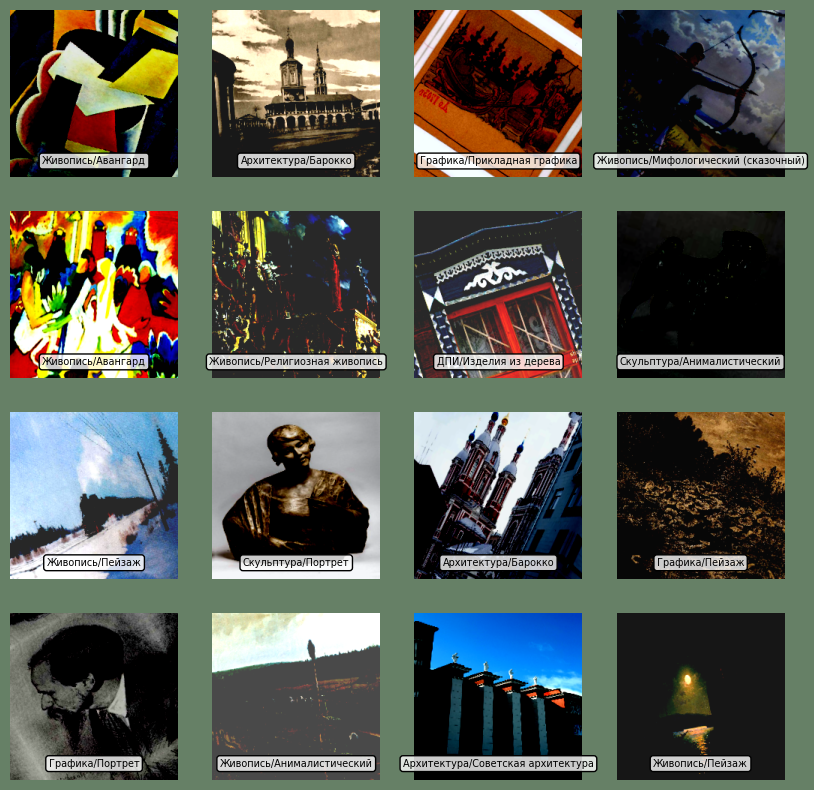

In [19]:
visualize_ds(train_ds,4,4,class_mapping)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

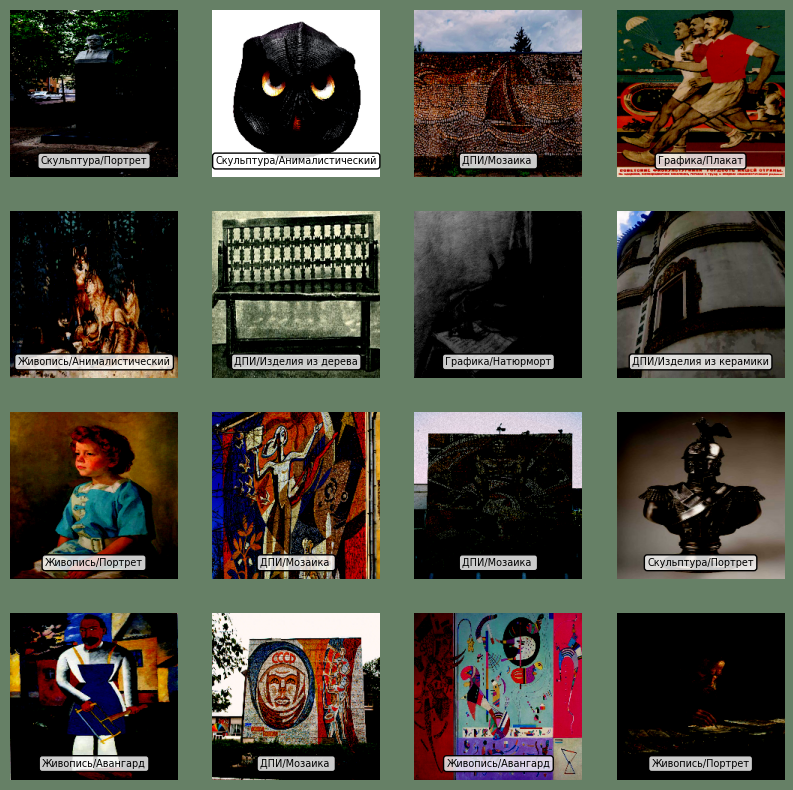

In [20]:
visualize_ds(val_ds,4,4,class_mapping)

In [21]:
resnet_1_loaded = keras.models.load_model(os.path.join('resnet_2','cp_2-008.keras'))
resnet_2_loaded = keras.models.load_model(os.path.join('resnet_2','cp_3-111.keras'))

In [22]:
resnet_2_loaded.compile(optimizer=keras.optimizers.Adam(5e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy'],)

In [23]:
# score_1_tr = resnet_1_loaded.evaluate(train_ds)

In [24]:
# np.mean(score_1_tr[2].numpy())

In [25]:
# score_1_te = resnet_1_loaded.evaluate(val_ds)

In [26]:
# np.mean(score_1_te[2].numpy())

In [27]:
# score_2_tr = resnet_2_loaded.evaluate(train_ds)

In [28]:
# np.mean(score_2_tr[2].numpy())

In [29]:
score_2_te = resnet_2_loaded.evaluate(val_ds)

54/54 ━━━━━━━━━━━━━━━━━━━━ 255s 4s/step - accuracy: 0.8489 - loss: 0.6915


In [33]:
resnet_2_loaded.save('resnet_2/cp_3-222.keras')

In [30]:
# np.mean(score_2_te[2].numpy())

In [31]:
1/0

ZeroDivisionError: division by zero

In [34]:
test_ds = create_tf_dataset_(test_table, train = False)

images readed


In [35]:
test_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 35), dtype=tf.float64, name=None))>

In [36]:
true_lables = []
true_lables_one_hot = []
for elem in test_ds.as_numpy_iterator():
    true_lables.append(np.argmax(elem[1][0]))
    true_lables_one_hot.append(elem[1][0])


In [37]:
true_lables[:10]

[8, 21, 34, 23, 10, 3, 1, 7, 16, 24]

In [38]:
test_table.head(10)

,image_name,label_id
6892,ab679e13e8954ea2abcce879939b260f.jpg,8
6893,721aa0aac39c4b84a032a2369ae66698.jpg,21
6894,3d8a839e79d74ce7a1a56e1e6499abb2.jpg,34
6895,0e85eb2b529944df8b2fbe3c40e6ce80.jpg,23
6896,d5394c50e835491ab36c5f83f17d1bb1.jpg,10
6897,8ca03acc2fb54343904d5035af2ac4f7.jpg,3
6898,3dee298157a04cf2bf72ca483db7310f.jpg,1
6899,f969047a4cf84d27a792e2021b59e0cc.jpg,7
6900,f692e5639b5944de8d92238f857ba587.jpg,16
6901,7ec11932ae7347afa90a6bf60bb53c6b.jpg,24


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

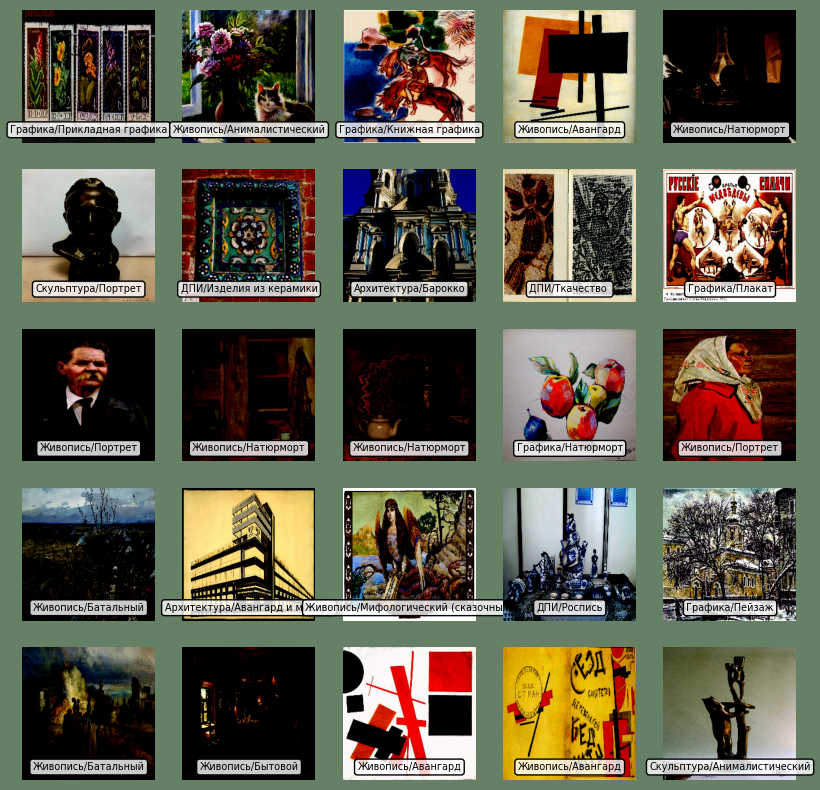

In [39]:
visualize_ds(test_ds,5,5,class_mapping)

In [40]:
preds_1_v = resnet_1_loaded.predict(test_ds)
preds_2_v = resnet_2_loaded.predict(test_ds)

1723/1723 ━━━━━━━━━━━━━━━━━━━━ 394s 225ms/step
1723/1723 ━━━━━━━━━━━━━━━━━━━━ 389s 223ms/step


In [41]:
preds_1 = []
preds_2 = []
for i in range(len(preds_1_v)):
    preds_1.append(np.argmax(preds_1_v[i]))
    preds_2.append(np.argmax(preds_2_v[i]))

In [42]:
preds_1[:10]

[8, 21, 34, 23, 30, 3, 1, 7, 34, 24]

In [43]:
true_lables[:10]

[8, 21, 34, 23, 10, 3, 1, 7, 16, 24]

#todo залочить шафл на тесте и придумать как сделать так, чтобы он каждый раз нормально себя вел
возможно не батчить и не шафлить

In [44]:
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
print('F1 для первой модели: {}'.format(f1_score(true_lables, preds_1, average='macro')))
print('Точность для первой модели: {}'.format(accuracy_score(true_lables,preds_1)))
print('################################')
print('F1 для второй модели: {}'.format(f1_score(true_lables, preds_2, average='macro')))
print('Точность для второй модели: {}'.format(accuracy_score(true_lables,preds_2)))

F1 для первой модели: 0.7867632412471725
Точность для первой модели: 0.8264654672083576
################################
F1 для второй модели: 0.816489511626676
Точность для второй модели: 0.8508415554265816


In [45]:
def visualize_val_ds(ds: tf.data.Dataset,preds: list, rows: int,coloumns: int, class_mapping: dict = None):
    '''
    visualize elements of ds with lables
    '''
    # fig = plt.figure(figsize=(10,10),facecolor = (0.4, 0.5, 0.4))
    fig = plt.figure(figsize=(15,15),facecolor = (0.12, 0.12, 0.12))
    rnd = random.randint(0,len(preds)-rows*coloumns)
    i = 0
    j = rnd
    for item in ds.unbatch().skip(rnd).take(rows*coloumns):
        image = item[0].numpy()
        image = (image+1)/2
        #todo сделать так, чтобы при разных предах были разные лейблы, а при одинаковых -один + рандом 
        #color1 DONE
        label = np.argmax(item[1].numpy())
        label_pred = preds[j]
        if class_mapping != None:
            label = class_mapping[label]
            label_pred = class_mapping[label_pred]
        fig.add_subplot(rows,coloumns,i+1)
        plt.imshow(image)
        plt.axis('off')
        if label == label_pred:
            x_text = image.shape[1]/2
            y_text = image.shape[0]*0.8
            plt.text(x_text, y_text,label, size=9,
                    ha="center", va="center",
                    bbox=dict(boxstyle="round",
                    ec=(0, 0, 0),
                    fc=(0, 0.6, 0, 0.8),
                    )
                    )
        else:
            x_text = image.shape[1]/2
            y_text = image.shape[0]*0.8
            y_text_pred = image.shape[0]*0.9
            plt.text(x_text, y_text,label, size=9,
                    ha="center", va="center",
                    bbox=dict(boxstyle="round",
                    ec=(0, 0, 0),
                    fc=(0, 0.6, 0, 0.8),
                    )
                    )
            
            plt.text(x_text, y_text_pred,label_pred, size=9,
                    ha="center", va="center",
                    bbox=dict(boxstyle="round",
                    ec=(0, 0, 0),
                    fc=(0.6, 0, 0, 0.8),
                    )
                    )
        i+=1
        j+=1
    plt.show()

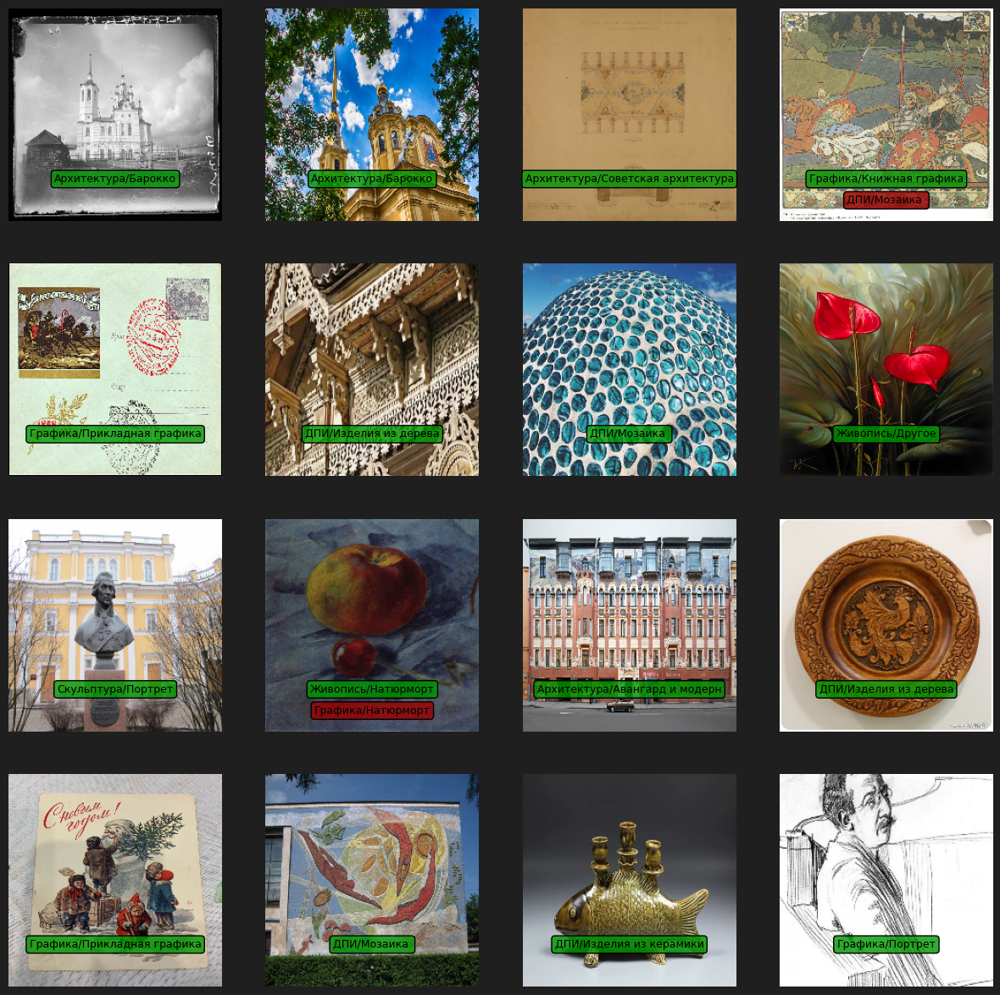

In [46]:
visualize_val_ds(test_ds, preds_2,4,4,class_mapping)

---------------------

In [48]:
test_2 = create_test_dataset(test_table)

In [49]:
test_2

<_PrefetchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [50]:
resnet_fin_loaded =  keras.models.load_model(os.path.join('resnet_2','cp_3-222.keras'))

c:\Users\ntsec\anaconda3\envs\new_env\lib\site-packages\keras\src\saving\saving_lib.py:394: UserWarning: Skipping variable loading for optimizer 'adam', because it has 690 variables whereas the saved optimizer has 2 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


In [51]:
preds_ = resnet_fin_loaded.predict(test_2)

1723/1723 ━━━━━━━━━━━━━━━━━━━━ 455s 260ms/step


In [52]:
preds = []
for i in range(len(preds_)):
    preds.append(np.argmax(preds_[i]))

In [62]:
preds[:20]

[8, 10, 34, 23, 1, 3, 1, 7, 34, 24, 31, 10, 1, 5, 31, 4, 17, 14, 6, 15]

In [63]:
true_lables[:20]

[8, 21, 34, 23, 10, 3, 1, 7, 16, 24, 31, 10, 10, 5, 31, 4, 17, 14, 6, 15]

In [55]:
print('F1 для первой модели: {}'.format(f1_score(true_lables, preds, average='macro')))
print('Точность для первой модели: {}'.format(accuracy_score(true_lables,preds)))

F1 для первой модели: 0.816489511626676
Точность для первой модели: 0.8508415554265816


In [56]:
def visualize_test_ds(ds: tf.data.Dataset,preds: list, rows: int,coloumns: int, class_mapping: dict = None):
    '''
    visualize elements of ds with lables
    '''
    # fig = plt.figure(figsize=(10,10),facecolor = (0.4, 0.5, 0.4))
    fig = plt.figure(figsize=(15,15),facecolor = (0.12, 0.12, 0.12))
    rnd = random.randint(0,len(preds)-rows*coloumns)
    i = 0
    j = rnd
    for item in ds.unbatch().skip(rnd).take(rows*coloumns):
        image = item.numpy()
        image = (image+1)/2
        label_pred = preds[j]
        if class_mapping != None:
            label_pred = class_mapping[label_pred]
        fig.add_subplot(rows,coloumns,i+1)
        plt.imshow(image)
        plt.axis('off')
        x_text = image.shape[1]/2
        y_text = image.shape[0]*0.8
        plt.text(x_text, y_text, label_pred, size=9,
                ha="center", va="center",
                bbox=dict(boxstyle="round",
                ec=(0, 0, 0),
                fc=(0, 0.6, 0.4, 0.8),
                )
                )
        i+=1
        j+=1
    plt.show()

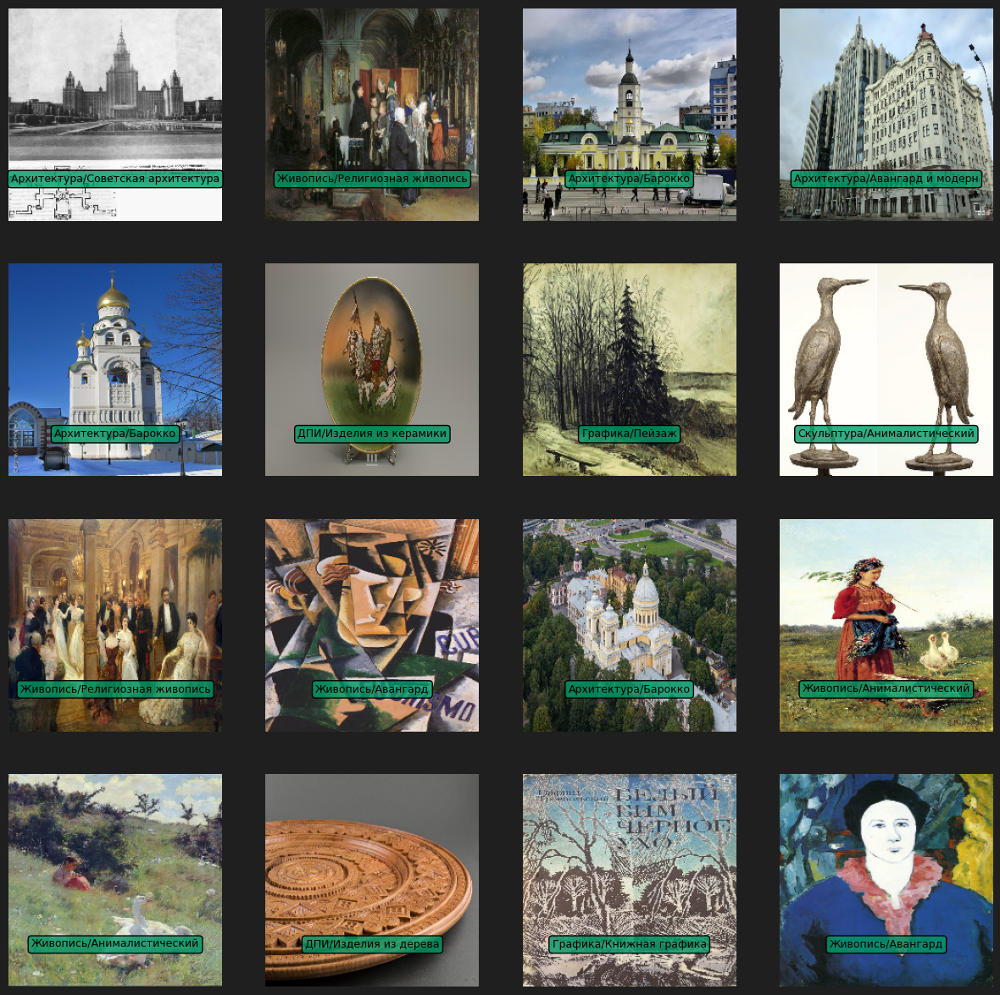

In [58]:
visualize_test_ds(test_2,preds,4,4,class_mapping)

In [68]:
test_table['image_name'].values

array(['ab679e13e8954ea2abcce879939b260f.jpg',
       '721aa0aac39c4b84a032a2369ae66698.jpg',
       '3d8a839e79d74ce7a1a56e1e6499abb2.jpg', ...,
       'f455dcc345a245f4991dca7146a2b144.jpg',
       '4fd4eb5c7e1844ab8bbf28ef03fabafc.jpg',
       '10a1bde101f94b6ebdf18fad5bbd1863.jpg'], dtype=object)